# Notebook for analysis of MCA pseudobulk and single cell GRN

## Imports

In [1]:
#Import libraries
import os
import glob
import pickle
import pandas as pd
import numpy as np
from pyscenic.aucell import aucell
import seaborn as sns
import scanpy
import scanpy.api as sc
from matplotlib import pyplot as plt
from sklearn import preprocessing
import matplotlib

/home/andreas/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/home/andreas/anaconda3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
/home/andreas/anaconda3/lib/python3.7/site-packages/scanpy/api/__init__.py:6: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning,


In [2]:
#Set figure parameters
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
scanpy.api.set_figure_params(scanpy=True, dpi=80, dpi_save=1200, frameon=True, vector_friendly=True)

# Preprocess scanpy objects

In [3]:
from RegulonPreprocessing import preprocess_pb

In [4]:
droplet, facs, mca = preprocess_pb('data')

Loading datasets
Subsetting genes (expressed in 10% of cells in all datasets)


Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.var` of view, copying.
Trying to set attribute `.obs` of view, copying.


Normalizing


Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


Log transforming
Detecting highly variable genes
Regressing out: # counts and % mito
Scaling


Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


Removing unannotated cells
Annotating datasets


In [5]:
#Read colormap
colormap = pd.read_csv('data/ColorMap.csv', sep=';')

# Expression space

In [6]:
di = {cell:color for cell,color in zip(colormap['celltype'], colormap['color_grad'])}
mca.uns['celltype_colors'] = [di[x] for x in mca.obs['celltype'].cat.categories]

In [7]:
sc.tl.pca(mca, svd_solver='arpack')


... storing 'protocol' as categorical
... storing 'phase' as categorical


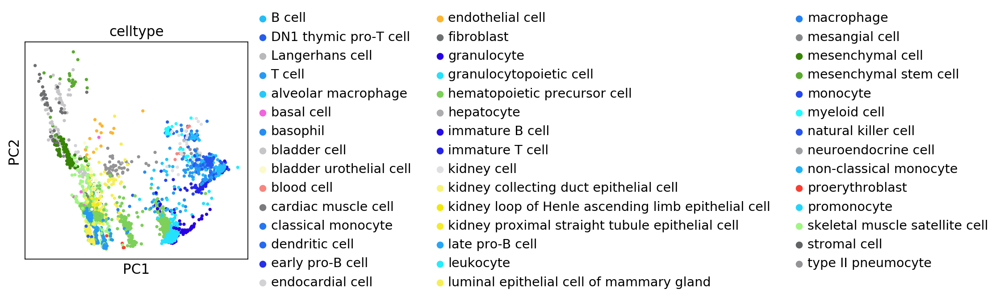

In [8]:
sc.pl.pca(mca, color='celltype')


In [9]:
sc.pp.neighbors(mca, n_neighbors=10, n_pcs=10)


In [10]:
sc.tl.umap(mca)


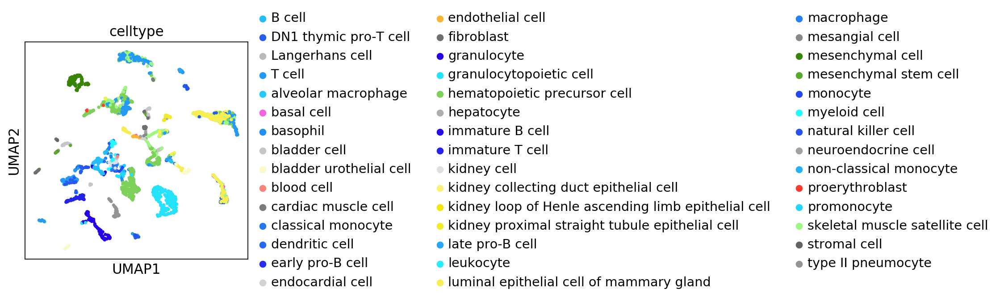

In [11]:
sc.pl.umap(mca, color=['celltype'])


# Regulon space

In [12]:
#Settings
DATA_FOLDER="/home/andreas/Documents/notebooks/MCA_TM/SCENIC/database_SCENIC/tmp/mca"
REGULONS_FNAME = os.path.join(DATA_FOLDER, "regulons_10_percent.p")
MOTIFS_FNAME = os.path.join(DATA_FOLDER, "motifs_10_percent.csv")

In [13]:
#Reload precomputed regulons
with open(REGULONS_FNAME, "rb") as f:
    regulons_mca = pickle.load(f)

In [14]:
#make expression matrix
ex_matrix = mca.X
ex_matrix = pd.DataFrame(data= ex_matrix,
                              index=mca.obs.index.tolist(),
                              columns=mca.var.index.tolist())
        
#calculate regulon AUC
mca_auc_mtx = aucell(ex_matrix, regulons_mca, num_workers=10)

In [15]:
mca_auc_mtx.to_csv('data/pb_mca_auc_mtx.csv')

In [16]:
from RegulonAnalysis import RegulonsAnalysis

In [17]:
#initialize regulon object
mca1 = RegulonsAnalysis( regulons_mca,  mca, mca_auc_mtx)


PCA not computed - using 5 principal components


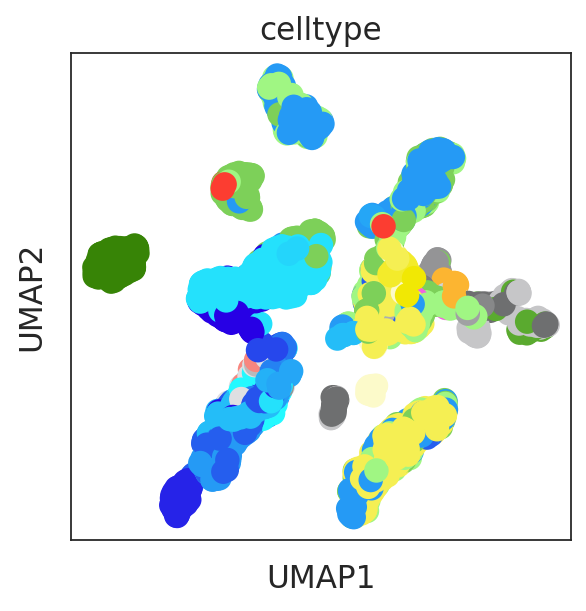

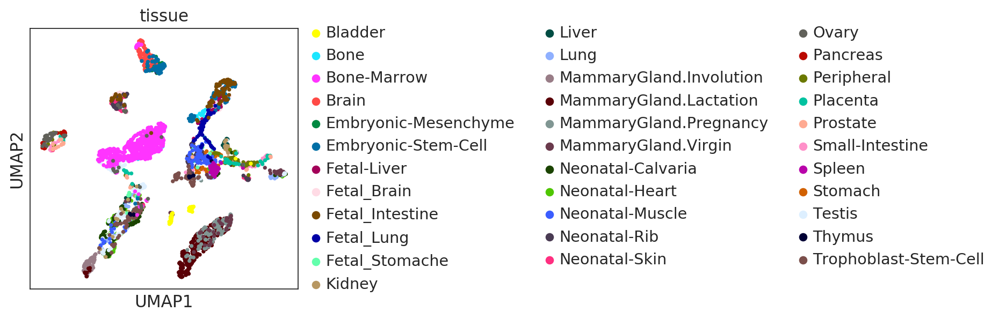

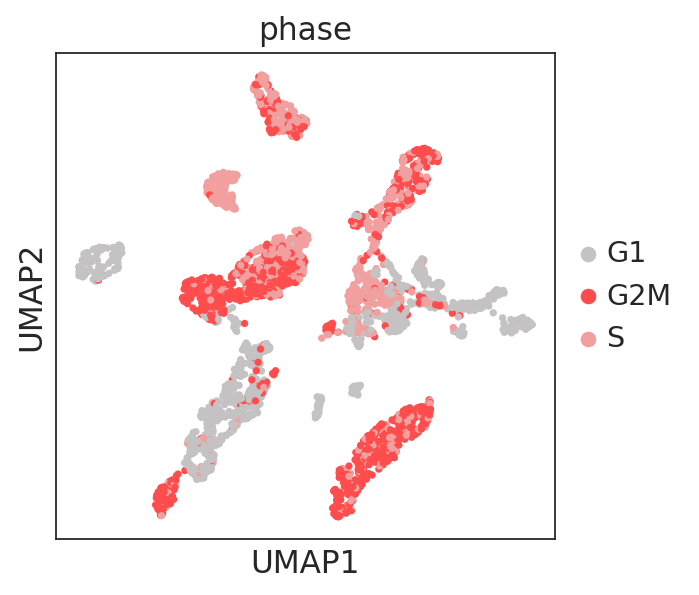

In [18]:
mca1.plot('umap', 'celltype', color_index=colormap, pcs= 5, color_index_type='color_grad')
mca1.plot('umap', 'tissue', color_index=colormap, pcs= 5, color_index_type='color_grad')
mca1.plot('umap', 'cellcycle', color_index=colormap, pcs= 5, color_index_type='color_grad')

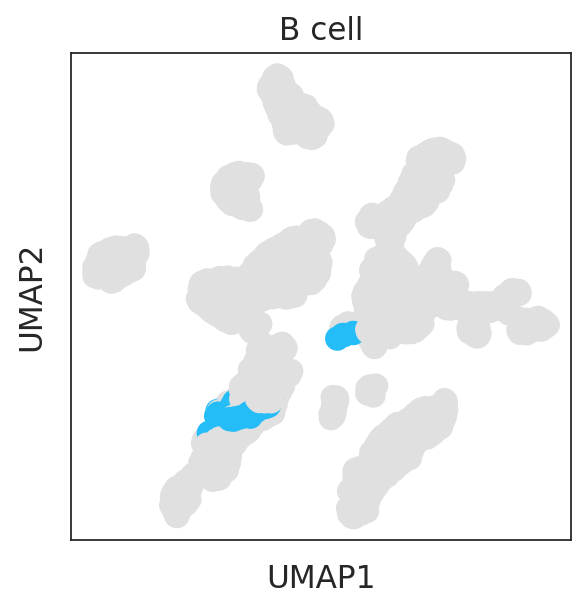

In [19]:
mca1.plot_by_celltype_ind(Type='B cell',dr ='umap', color_index=colormap, pcs= 5)

Plot a few regulon activities

## Cell to cell correlation based on RAS

/home/andreas/anaconda3/lib/python3.7/site-packages/seaborn/matrix.py:624: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


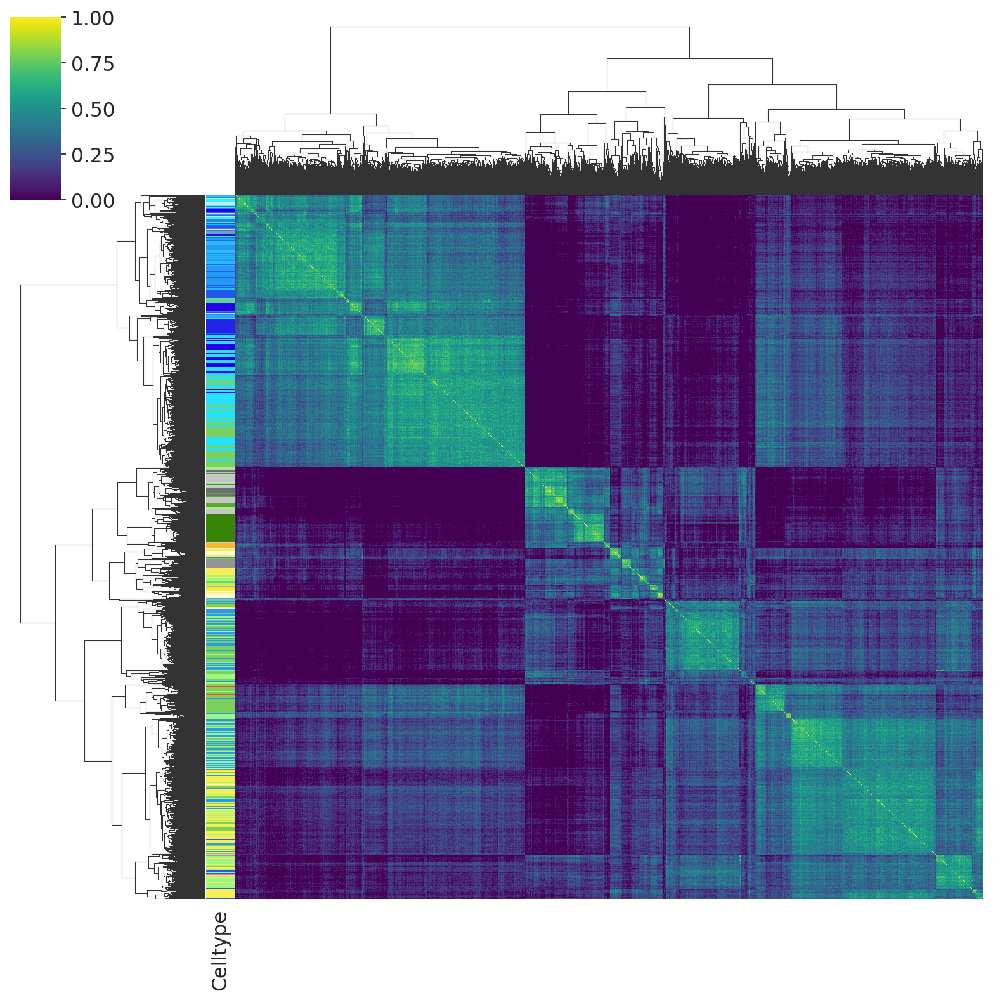

In [20]:
#remember to calculate tsne with celltypes before. Or else, celltype_colors will not be stored in the scanpy object
mca1.cell_regulon_cor(color_index = colormap, color_by='color_grad')


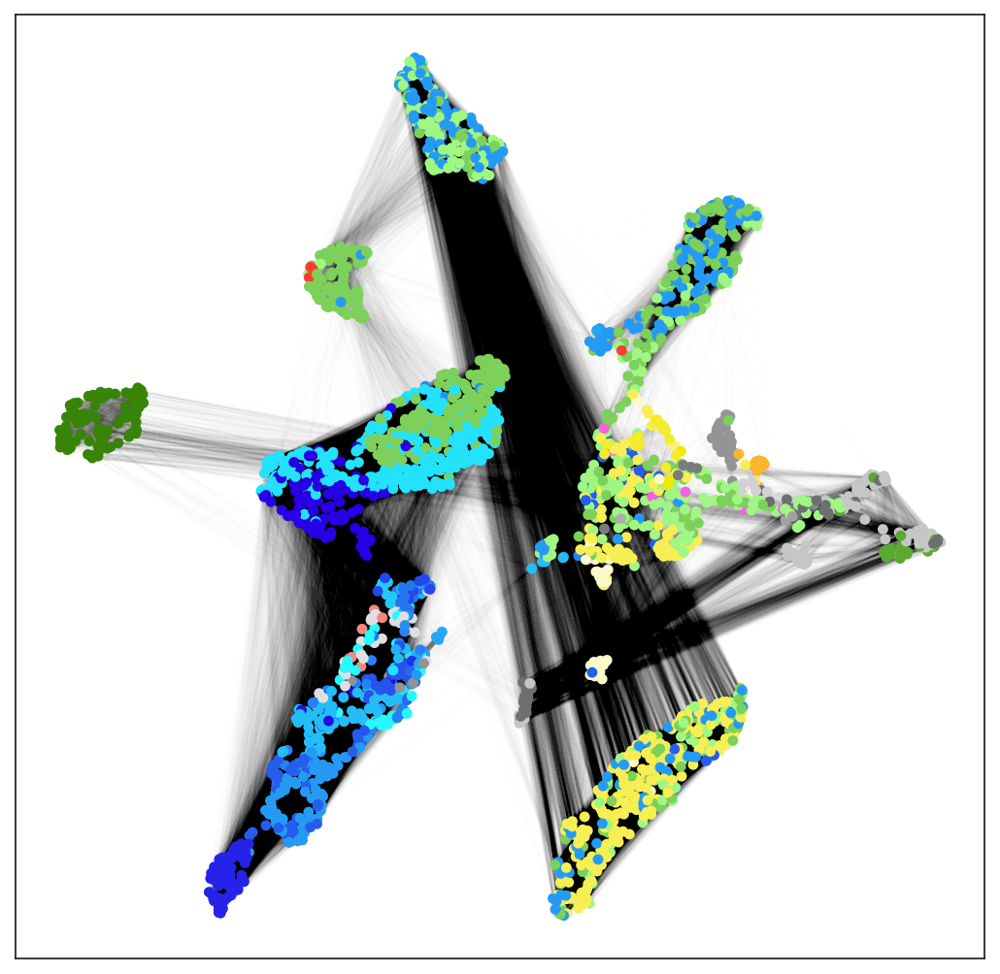

In [21]:
mca1.cell_regulon_network(0.50, color_index = colormap, dr='umap', pcs=5, color_by = 'color_grad', save = 'data/pseudobulk_tsne_droplet.gexf')

/home/andreas/anaconda3/lib/python3.7/site-packages/seaborn/matrix.py:624: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


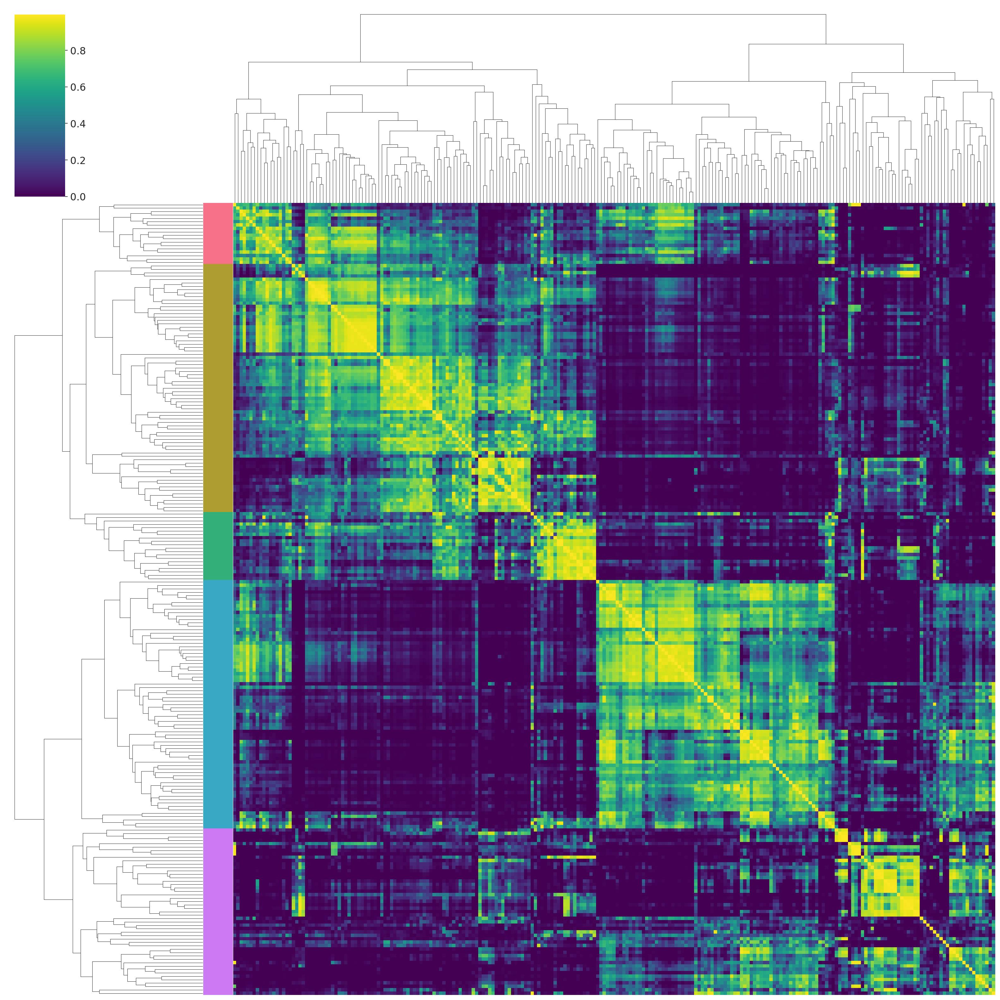

In [22]:
mca1.plot_csi()




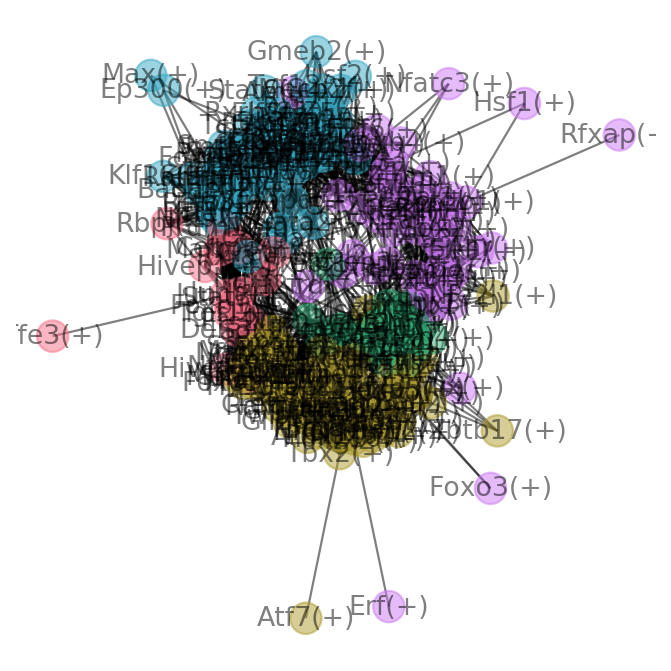

In [23]:
mca1.regulon_network(0.70, save = 'data/regulon_network_mca_pseudobulk_5clust.gexf', lut=None)


# single-cell cleaning

In [24]:
mca = sc.read('data/mca_scanpy_no_processing.h5ad')

#getting annotation from scmap projection of droplet
mca_ann = pd.read_csv('data/mca_annotation_projected_from_drop.tsv', sep= '\t')

#getting annotation from scmap projection of droplet
mca.obs['original_annotation'] =  mca_ann['original'].values
mca.obs['from_droplet'] =  mca_ann['projected_drom_droplet'].values
mca.obs['celltype'] = pd.Categorical(mca.obs['from_droplet'])


In [25]:
#Number of cells before processing
print(mca.n_obs)

233994


Remove cells not annotated by author

In [26]:
mca.obs['original_annotation'].replace(np.NaN, 'Non-annotated', inplace = True)

In [27]:
mca = mca[mca.obs['original_annotation'] != 'Non-annotated']

Remove cells not mapped by scmap

In [28]:
mca = mca[mca.obs['from_droplet'] != 'unassigned']

In [29]:
mca.obs['n_counts'] = mca.X.sum(axis=1).A1
sc.pp.calculate_qc_metrics(mca, inplace = True)

Trying to set attribute `.obs` of view, copying.


In [30]:
from RegulonPreprocessing import stats

In [31]:
stats([mca], ['MCA'])

,MCA
# Tissues,38.000000
Mean Counts,1301.728882
Median Counts,942.000000
Mean Genes,708.300353
Median Genes,588.000000
Author cell-types,732.000000
Cells,150889.000000


In [32]:
#library size normalization
sc.pp.normalize_per_cell(mca, counts_per_cell_after=1e4)

#log transform
sc.pp.log1p(mca)

In [33]:
mito_genes_mca = mca.var_names.str.startswith('Mt')

In [34]:
mca.obs['percent_mito'] = np.sum(
    mca[:, mito_genes_mca].X) / np.sum(mca.X)

In [35]:
mca.obs['n_counts'] = mca.X.sum(axis=1).A1

In [36]:
sc.pp.filter_genes(mca, min_counts=1)


In [38]:
mca.obs['protocol'] = 'Microwell-seq'

In [39]:
from RegulonPreprocessing import score_cell_cycle
score_cell_cycle(mca)

In [40]:
mca_auc_mtx = pd.read_csv('data/mca_auc_mtx.csv', index_col = 0)

In [41]:
mca.X = mca.X.todense()

PCA not computed - using 30 principal components


... storing 'protocol' as categorical
... storing 'phase' as categorical
... storing 'original_annotation' as categorical


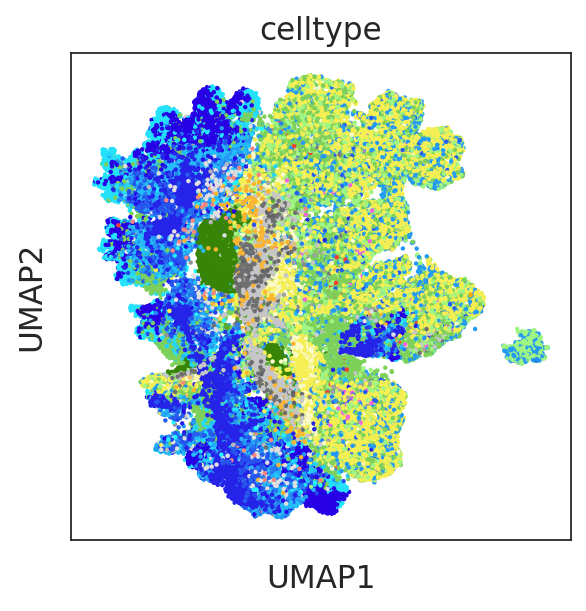

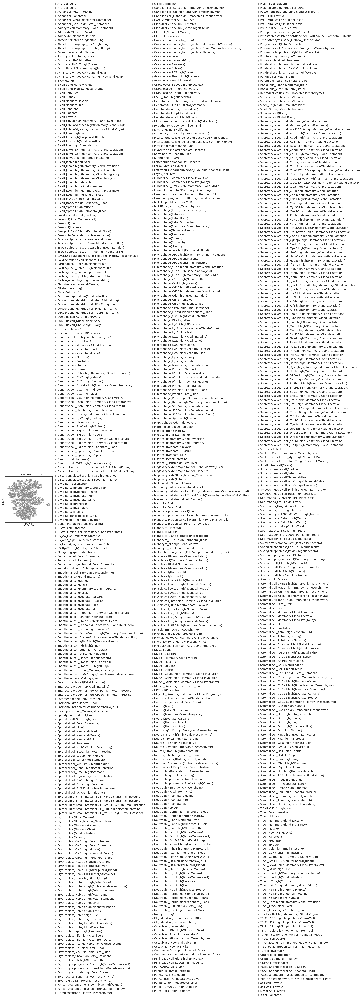

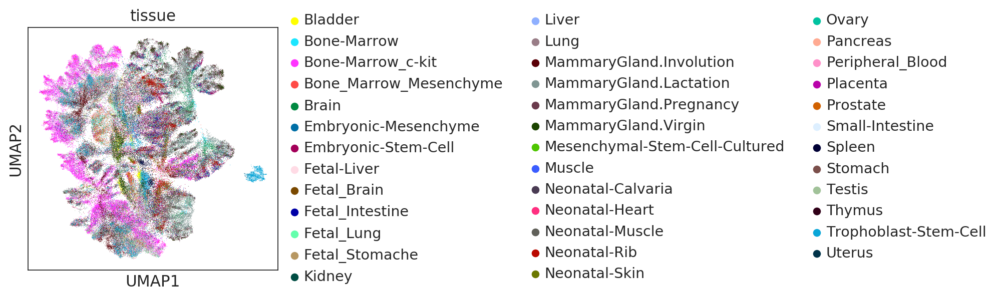

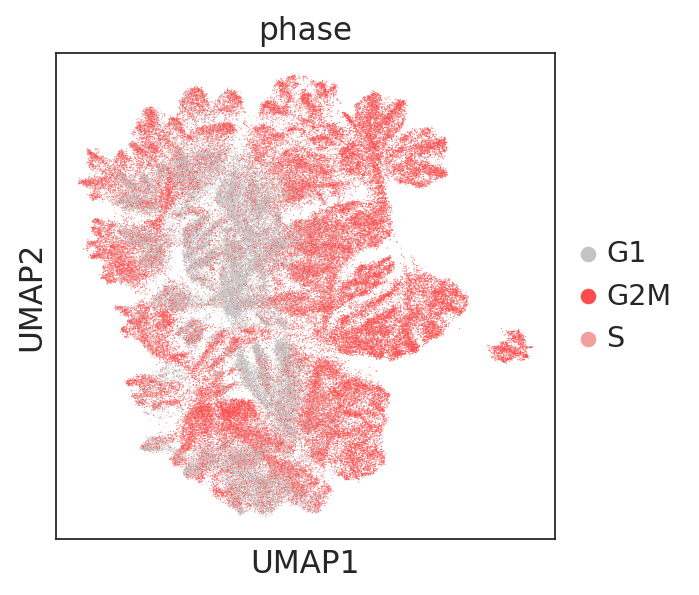

In [44]:
mca_all = RegulonsAnalysis( regulons_mca,  mca, mca_auc_mtx)
mca_all.plot('umap', 'celltype', color_index=colormap, pcs= 30, color_index_type='color_grad', point_size = 1)
mca_all.plot('umap', 'original_annotation', color_index=colormap, pcs= 30, color_index_type='color_grad', point_size = 1)
mca_all.plot('umap', 'tissue', color_index=colormap, pcs= 30, color_index_type='color_grad')
mca_all.plot('umap', 'cellcycle', color_index=colormap, pcs= 30, color_index_type='color_grad')

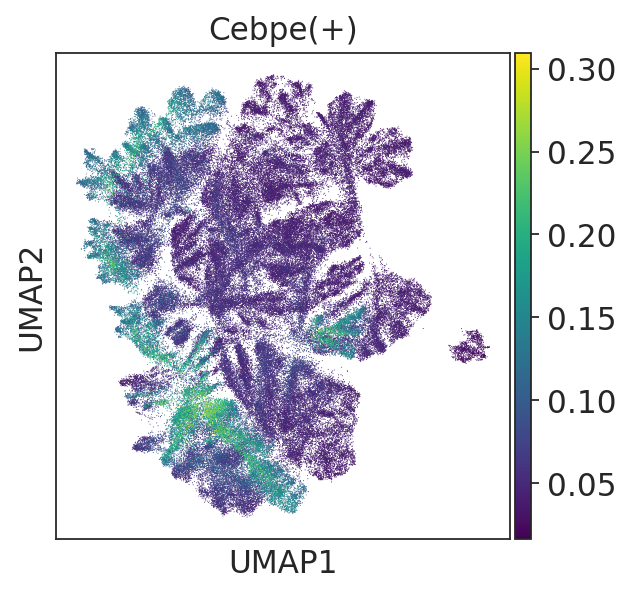

In [45]:
mca_all.plot('umap', 'Cebpe(+)', color_index=colormap, pcs= 30)


## Regulon specificity

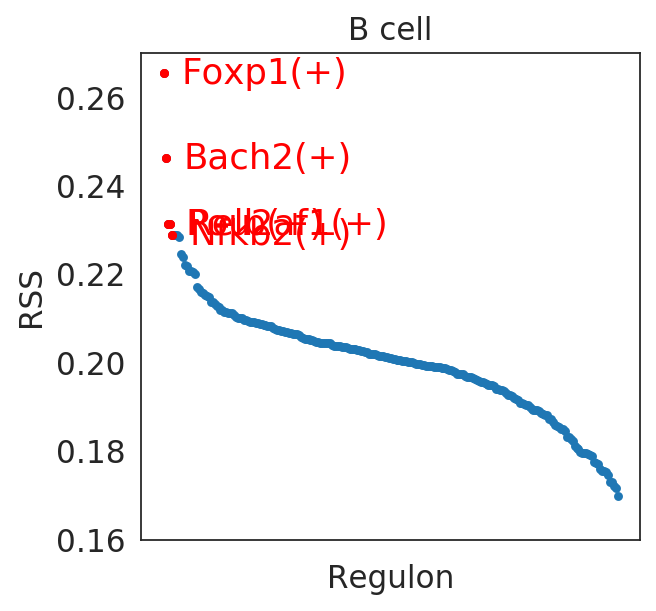

In [46]:
mca_all.plot_regulon_specificity_celltype('B cell')

## scmap mapping tables

In [47]:
#Mapping celltypes between datasets can be quantified as:
mca.obs.groupby(['original_annotation', 'from_droplet']).count().reset_index().pivot_table(
    index = 'original_annotation', columns = 'from_droplet', values = 'batch').head()

from_droplet,B cell,DN1 thymic pro-T cell,Fraction A pre-pro B cell,Langerhans cell,T cell,alveolar macrophage,basal cell,basal cell of epidermis,basophil,bladder cell,...,monocyte,myeloid cell,natural killer cell,neuroendocrine cell,non-classical monocyte,proerythroblast,promonocyte,skeletal muscle satellite cell,stromal cell,type II pneumocyte
original_annotation,,,,,,,,,,,,,,,,,,,,,
AT1 Cell(Lung),8.0,10.0,NaN,1.0,20.0,NaN,NaN,NaN,NaN,6.0,...,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AT2 Cell(Lung),49.0,84.0,NaN,3.0,194.0,1.0,NaN,NaN,NaN,60.0,...,NaN,11.0,10.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN
Acinar cell(Fetal_Intestine),NaN,NaN,NaN,NaN,24.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2.0,2.0,1.0,NaN,NaN
Acinar cell(Pancreas),NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,3.0,...,1.0,NaN,NaN,1.0,1.0,NaN,NaN,3.0,NaN,NaN
Acinar cell_Ctrb1 high(Fetal_Stomache),NaN,2.0,NaN,5.0,3.0,NaN,NaN,NaN,NaN,NaN,...,NaN,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
